In [1]:
%pylab inline
%config InlineBackend.figure_formats = ['retina']

from collections import OrderedDict

import pandas as pd
import seaborn as sns
sns.set()
import pickle
import itertools

from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, auc, accuracy_score

import matplotlib.pyplot as plt

Populating the interactive namespace from numpy and matplotlib


In [2]:
path = 'instacart_data_subset/'
dfoi = pd.read_csv(path + 'orders_subset.csv')
dfoi.head(3)

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,1363380,50,prior,1,3,9,NaN
1,3131103,50,prior,2,6,12,10.0
2,2197066,50,prior,3,1,13,9.0


In [3]:
dfpi = pd.read_csv(path + 'order_products__prior_subset.csv')
dfpi.head(3)

,order_id,product_id,add_to_cart_order,reordered
0,12,30597,1,1
1,12,15221,2,1
2,12,43772,3,1


In [4]:
dfc = pd.read_csv(path + 'order_products__train_subset.csv')
dfc.head(3)

,order_id,product_id,add_to_cart_order,reordered
0,1077,13176,1,1
1,1077,39922,2,1
2,1077,5258,3,1


In [5]:
dfai = dfpi.merge(dfoi.drop('eval_set', axis=1),on='order_id')
dfc = dfc.merge(dfoi.drop('eval_set', axis=1),on='order_id')

In [6]:
dfai.head(3)

,order_id,product_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,12,30597,1,1,152610,22,6,8,10.0
1,12,15221,2,1,152610,22,6,8,10.0
2,12,43772,3,1,152610,22,6,8,10.0


In [7]:
with open('dfpbu.pkl', 'rb') as f:
    dfpbu = pickle.load(f)
dfpbu.head(3)

,product_id,user_id,orders,times_ordered,last_time_ordered,last_order,orders_since_last_time_ordered,days_since_ordered_last
0,1,21285,{2730676},1,2,48,46,340.0
1,3298,21285,{2730676},1,2,48,46,340.0
2,4920,21285,"{2910961, 3240764, 2915357}",3,16,48,32,230.0


In [8]:
current_ids = dfc['user_id'].unique()
current_ids

array([173934, 129386, 156818, ..., 199878,  20949,  15818])

In [9]:
df_X = dfpbu[dfpbu['user_id'].isin(current_ids)]
df_X.head(3)


,product_id,user_id,orders,times_ordered,last_time_ordered,last_order,orders_since_last_time_ordered,days_since_ordered_last
0,1,21285,{2730676},1,2,48,46,340.0
1,3298,21285,{2730676},1,2,48,46,340.0
2,4920,21285,"{2910961, 3240764, 2915357}",3,16,48,32,230.0


In [10]:
current_carts = (dfc.groupby('user_id',as_index=False)
                 .agg({'product_id':(lambda x: set(x))})
                 .rename(columns={'product_id':'latest_cart'}))
df_X = df_X.merge(current_carts, on='user_id')
df_X['in_cart'] = (df_X.apply(lambda row: row['product_id'] in row['latest_cart'], axis=1).astype(int))


In [11]:

df_X.head(10)

,product_id,user_id,orders,times_ordered,last_time_ordered,last_order,orders_since_last_time_ordered,days_since_ordered_last,latest_cart,in_cart
0,1,21285,{2730676},1,2,48,46,340.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0
1,3298,21285,{2730676},1,2,48,46,340.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0
2,4920,21285,"{2910961, 3240764, 2915357}",3,16,48,32,230.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0
3,6066,21285,"{2045938, 2488003}",2,25,48,23,161.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0
4,6184,21285,"{3256832, 1449505, 2567235, 2817229, 867643, 2...",6,46,48,2,7.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0
5,7987,21285,"{1716278, 1186871}",2,21,48,27,189.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0
6,10509,21285,"{2476291, 3268422, 2072264, 2168016, 2915357}",5,37,48,11,70.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0
7,11759,21285,"{3256832, 2476291, 1054731, 307468, 2012695, 2...",30,47,48,1,0.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",1
8,12341,21285,"{3256832, 873218, 2476291, 1054731, 1414680, 2...",35,48,48,0,0.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",1
9,13042,21285,{2107766},1,8,48,40,293.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0


In [12]:
df_X['last_order_p_total_orders'] = df_X['orders_since_last_time_ordered']/df_X['last_order']

In [13]:
prod_features = ['product_total_orders','product_avg_add_to_cart_order']

df_prod_features = (dfpi.groupby(['product_id'],as_index=False)
                    .agg(OrderedDict([('order_id','nunique'),
                                      ('add_to_cart_order','mean')])))
df_prod_features.columns = ['product_id'] + prod_features
df_prod_features.head(3)

,product_id,product_total_orders,product_avg_add_to_cart_order
0,1,26,4.576923
1,2,1,3.000000
2,3,1,4.000000


In [14]:
df_X = df_X.merge(df_prod_features, on='product_id')

df_X.head(3)

,product_id,user_id,orders,times_ordered,last_time_ordered,last_order,orders_since_last_time_ordered,days_since_ordered_last,latest_cart,in_cart,last_order_p_total_orders,product_total_orders,product_avg_add_to_cart_order
0,1,21285,{2730676},1,2,48,46,340.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0,0.958333,26,4.576923
1,1,47549,"{2609753, 2946722, 2067429, 3370662}",4,21,26,5,81.0,"{27845, 27790, 13042, 10326, 37687}",0,0.192308,26,4.576923
2,1,54136,{1501823},1,18,23,5,64.0,"{47977, 5450, 26604, 5296, 11123, 24852, 10070...",0,0.217391,26,4.576923


In [15]:
user_features = ['user_total_orders','user_avg_cartsize','user_total_products','user_avg_days_since_prior_order']

df_user_features = (dfai.groupby(['user_id'],as_index=False)
                                           .agg(OrderedDict(
                                                   [('order_id',['nunique', (lambda x: x.shape[0] / x.nunique())]),
                                                    ('product_id','nunique'),
                                                    ('days_since_prior_order','mean')])))

df_user_features.columns = ['user_id'] + user_features
df_user_features.head(3)

,user_id,user_total_orders,user_avg_cartsize,user_total_products,user_avg_days_since_prior_order
0,50,67,6.761194,89,5.691275
1,52,27,6.259259,51,9.134969
2,65,14,9.428571,80,13.594828


In [16]:
df_X = df_X.merge(df_user_features, on='user_id')
df_X = df_X.dropna() # note that this is naive NaN handling for simplicity
df_X.head(1)

,product_id,user_id,orders,times_ordered,last_time_ordered,last_order,orders_since_last_time_ordered,days_since_ordered_last,latest_cart,in_cart,last_order_p_total_orders,product_total_orders,product_avg_add_to_cart_order,user_total_orders,user_avg_cartsize,user_total_products,user_avg_days_since_prior_order
0,1,21285,{2730676},1,2,48,46,340.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0,0.958333,26,4.576923,48,6.604167,46,8.044872


/Users/jackselbo/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, ou

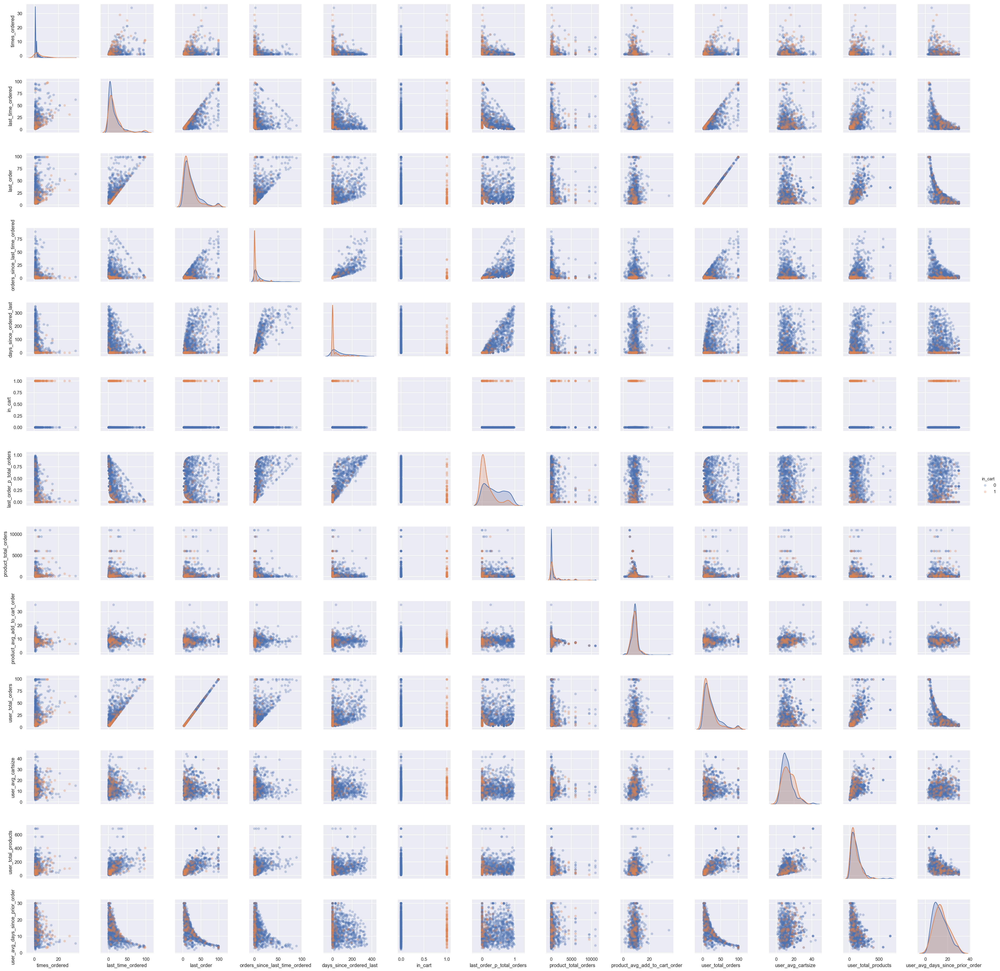

In [17]:
def plot_features(df, sample_size=500):
    
    sample = (df.drop(['product_id','user_id','latest_cart'],axis=1)
                .sample(1000, random_state=44)) 
    sns.pairplot(sample,hue='in_cart', plot_kws=dict(alpha=.3, edgecolor='none'))

plot_features(df_X)

In [18]:
def get_user_split_data(df, test_size=.2, seed=42):

    rs = np.random.RandomState(seed)
    
    total_users = df['user_id'].unique() 
    test_users = rs.choice(total_users, 
                           size=int(total_users.shape[0] * test_size), 
                           replace=False)

    df_tr = df[~df['user_id'].isin(test_users)]
    df_te = df[df['user_id'].isin(test_users)] 

    y_tr, y_te = df_tr['in_cart'], df_te['in_cart']

    return df_tr, df_te, y_tr, y_te

In [19]:
df_tr, df_te, y_tr, y_te = get_user_split_data(df_X)

X_tr = df_tr.drop(['product_id','orders','user_id','latest_cart','in_cart'],axis=1) 
X_te = df_te.drop(['product_id','orders','user_id','latest_cart','in_cart'],axis=1)

lr = LogisticRegressionCV(class_weight='balanced')
lr.fit(X_tr, y_tr)
f1_score(lr.predict(X_te), y_te)

/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/linear

0.3407758861289422

In [20]:
user_prod_features = ['user_product_avg_add_to_cart_order']

df_user_prod_features = (dfai.groupby(['product_id','user_id'],as_index=False)
                                                .agg(OrderedDict(
                                                     [('add_to_cart_order','mean')])))

df_user_prod_features.columns = ['product_id','user_id'] + user_prod_features 
df_user_prod_features.head()

,product_id,user_id,user_product_avg_add_to_cart_order
0,1,21285,3.0
1,1,47549,4.0
2,1,54136,3.0
3,1,54240,2.0
4,1,95730,1.0


In [21]:
df_X = df_X.merge(df_user_prod_features,on=['user_id','product_id'])
df_X['user_product_order_freq'] = df_X['times_ordered'] / df_X['user_total_orders'] 
df_X.head(1)

,product_id,user_id,orders,times_ordered,last_time_ordered,last_order,orders_since_last_time_ordered,days_since_ordered_last,latest_cart,in_cart,last_order_p_total_orders,product_total_orders,product_avg_add_to_cart_order,user_total_orders,user_avg_cartsize,user_total_products,user_avg_days_since_prior_order,user_product_avg_add_to_cart_order,user_product_order_freq
0,1,21285,{2730676},1,2,48,46,340.0,"{21573, 35561, 37710, 11759, 12341, 13176, 32478}",0,0.958333,26,4.576923,48,6.604167,46,8.044872,3.0,0.020833


/Users/jackselbo/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, ou

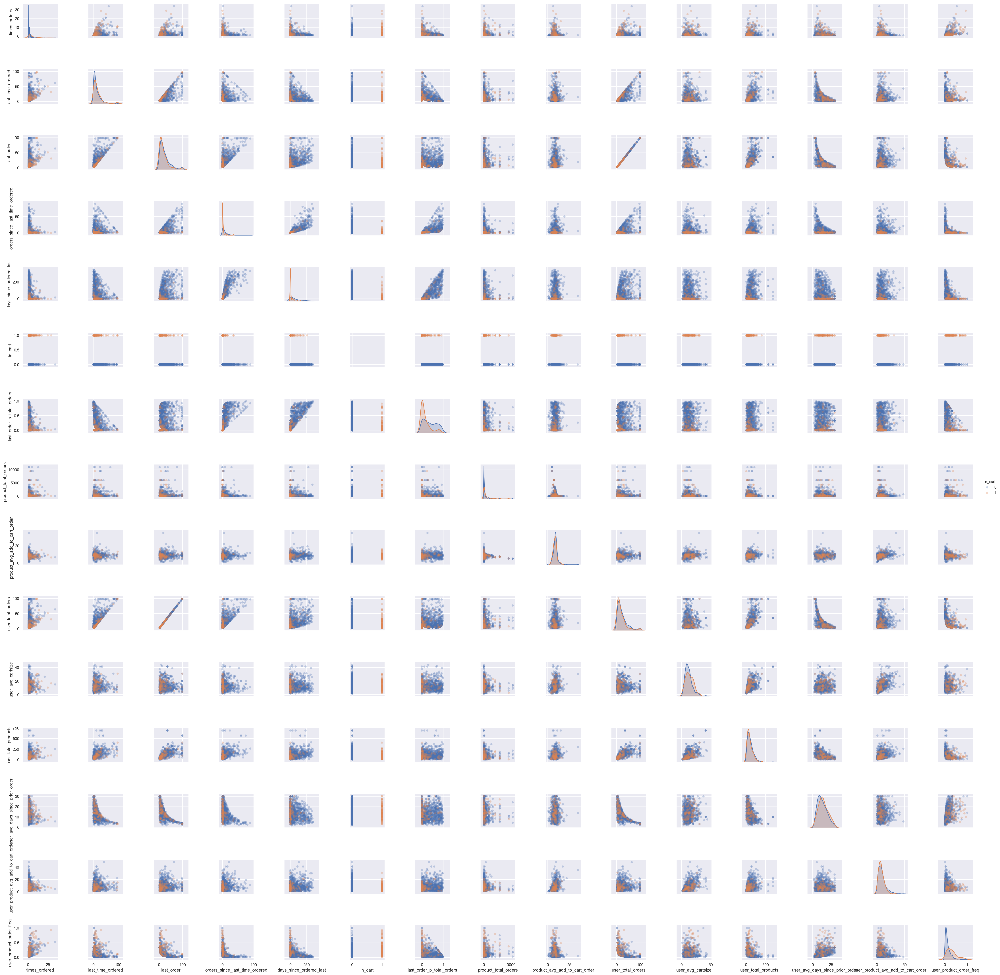

In [22]:
plot_features(df_X)

In [23]:
lr = LogisticRegressionCV(class_weight='balanced')
lr.fit(X_tr, y_tr)
f1_score(lr.predict(X_te), y_te)

/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/linear

0.3407758861289422

In [24]:
lr.coef_

array([[ 1.74600384e-01,  9.49650445e-03, -7.78854372e-03,
        -1.72850482e-02, -5.20001465e-03, -1.05556708e+00,
         1.25508616e-04, -4.65872894e-02, -7.78854372e-03,
         4.25732083e-02, -5.06572249e-03,  9.74081543e-03]])

In [25]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_tr.values)
#X_val_scaled = scaler.transform(X_val.values)
X_test_scaled = scaler.transform(X_te.values)


In [26]:
lrscaled = LogisticRegressionCV(class_weight='balanced', penalty='l1', solver='saga')
lrscaled.fit(X_train_scaled, y_tr)
f1_score(lrscaled.predict(X_test_scaled), y_te)

/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


0.33999442974516086

In [27]:
lrscaled.coef_

array([[ 0.55935158,  0.        , -0.10471252, -0.23603676, -0.30881167,
        -0.50508309,  0.15825937, -0.15812857, -0.10471252,  0.26874889,
        -0.40998047,  0.02701818]])

In [28]:
df_X.columns # Dropped ['product_id','orders','user_id','latest_cart','in_cart']

Index(['product_id', 'user_id', 'orders', 'times_ordered', 'last_time_ordered',
       'last_order', 'orders_since_last_time_ordered',
       'days_since_ordered_last', 'latest_cart', 'in_cart',
       'last_order_p_total_orders', 'product_total_orders',
       'product_avg_add_to_cart_order', 'user_total_orders',
       'user_avg_cartsize', 'user_total_products',
       'user_avg_days_since_prior_order', 'user_product_avg_add_to_cart_order',
       'user_product_order_freq'],
      dtype='object')

In [29]:
# important features are times_ordered, days_since_ordered_last, last_order_p_total_orders, product_total_orders, user_product_order_freq

In [30]:
df_te['prediction_probability']=lr.predict_proba(X_test_scaled)[:,1]

In [31]:
confusion_matrix(df_te['in_cart'], df_te['prediction_probability']>.5)

array([[25459, 35734],
       [  711,  5699]])

In [32]:
df_te[['product_id','user_id','in_cart','prediction_probability']].sort_values('prediction_probability',ascending=False).head(10)

,product_id,user_id,in_cart,prediction_probability
27152,5785,101343,1,0.994909
299136,13944,113653,1,0.992974
32530,19660,132686,1,0.992935
24614,27086,94330,1,0.992424
27081,24852,101343,1,0.991619
266154,14233,154645,1,0.990824
27176,40852,101343,0,0.990777
159073,13176,172034,1,0.990579
148342,49609,2405,0,0.990483
27165,10017,101343,0,0.989802


In [33]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.grid(False)


Normalized confusion matrix
[[0.41604432 0.58395568]
 [0.11092044 0.88907956]]


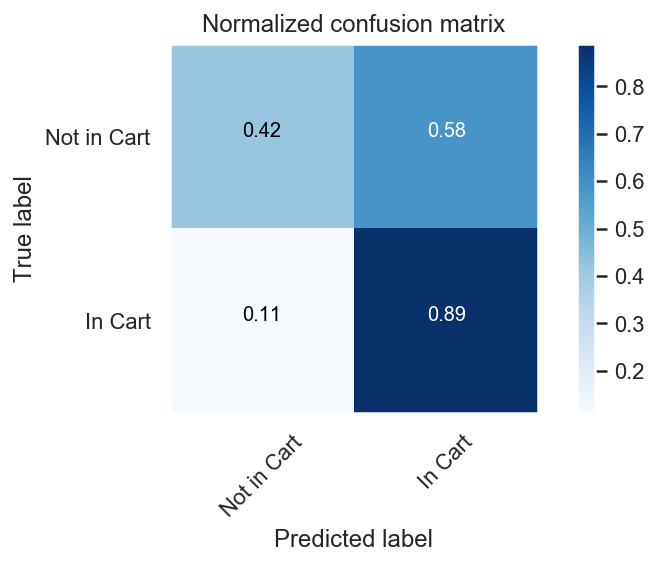

In [34]:
plt.figure()
cnf_matrix = confusion_matrix(df_te['in_cart'], df_te['prediction_probability']>.5)
plot_confusion_matrix(cnf_matrix, classes=['Not in Cart','In Cart'],normalize=True,
                      title='Normalized confusion matrix')

plt.show()

In [35]:
products = pd.read_csv('Data/products.csv')

In [36]:
products.head()

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


In [37]:
df_te[['product_id','user_id','in_cart','prediction_probability']].merge(products[['product_id', 'product_name']], on='product_id').sort_values('prediction_probability',ascending=False).head(10)

,product_id,user_id,in_cart,prediction_probability,product_name
17788,5785,101343,1,0.994909,Organic Reduced Fat 2% Milk
46433,13944,113653,1,0.992974,Pure Water
22679,19660,132686,1,0.992935,Spring Water
13948,27086,94330,1,0.992424,Half & Half
3547,24852,101343,1,0.991619,Banana
27523,14233,154645,1,0.990824,Natural Artesian Water
43831,40852,101343,0,0.990777,Lactose Free Fat Free Milk
2028,13176,172034,1,0.990579,Bag of Organic Bananas
52525,49609,2405,0,0.990483,Very Berry Flavor Sparking Mineral Water
34941,10017,101343,0,0.989802,Tilapia Filet


In [38]:
lrscaled.coef_

array([[ 0.55935158,  0.        , -0.10471252, -0.23603676, -0.30881167,
        -0.50508309,  0.15825937, -0.15812857, -0.10471252,  0.26874889,
        -0.40998047,  0.02701818]])

In [39]:
coef = pd.DataFrame(lrscaled.coef_.tolist()[0], columns=['scaled'])

In [40]:
coef

,scaled
0,0.559352
1,0.000000
2,-0.104713
3,-0.236037
4,-0.308812
5,-0.505083
6,0.158259
7,-0.158129
8,-0.104713
9,0.268749


In [41]:

coefs = {'names':['times_ordered','days_since_ordered_last','last_order_p_total_orders','product_total_orders','user_product_order_freq'], 
        'coef': [.04,-.17,-.38,.04,.53]}


In [42]:
coef = pd.DataFrame.from_dict(coefs)

In [43]:
coef.set_index('names')

,coef
names,
times_ordered,0.04
days_since_ordered_last,-0.17
last_order_p_total_orders,-0.38
product_total_orders,0.04
user_product_order_freq,0.53


Text(0.5, 1.0, 'Scaled Coefficient Values')

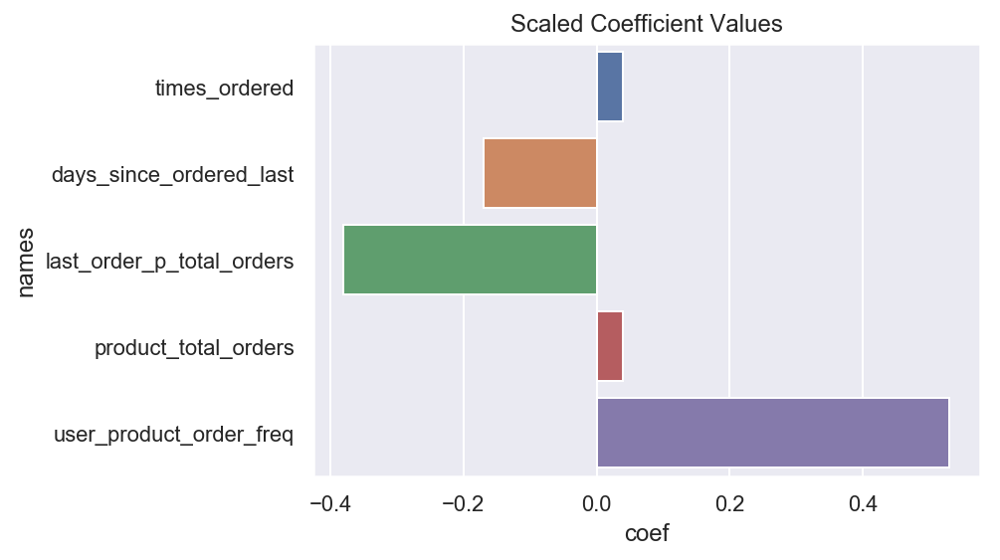

In [44]:
sns.barplot(x='coef',y = 'names',data=coef).set_title('Scaled Coefficient Values')

In [45]:
confusion_matrix(df_te['in_cart'], df_te['prediction_probability']>.5)

array([[25459, 35734],
       [  711,  5699]])

In [46]:
cm = [[25459,35734],[711,5699]]
recall = cm[1][1]/(cm[1][1]+cm[1][0])
precision = cm[1][1]/(cm[1][1]+cm[0][1])
f1 = (2*precision*recall)/(precision+recall)
print(recall,precision, f1)

0.8890795631825273 0.13754736562643305 0.2382375687143365


In [47]:
lrscaled = LogisticRegressionCV(class_weight='balanced', penalty='l1', solver='saga')
lrscaled.fit(X_train_scaled, y_tr)
f1_score(lrscaled.predict(X_test_scaled), y_te)

/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


0.34000626675486545

In [48]:
acc = (cm[0][0]+cm[1][1])/(cm[0][0]+cm[1][1]+cm[1][0]+cm[0][1])

In [49]:
print(acc)

0.46089670576749553


In [50]:
rot = df_te[['product_id','user_id','in_cart','prediction_probability']].merge(products[['product_id', 'product_name']], on='product_id').sort_values('prediction_probability',ascending=False)

In [51]:
rot.groupby(['user_id']).agg({'product_name':(lambda x: set(x))},{'product_id':'count'}).head(15)

,product_name
user_id,
330,"{Ibuprofen Liqui-Gels Capsules, Lavender Dish ..."
399,"{Organic Ketchup, Organic Dark Chocolate Peanu..."
1136,"{Green Seedless Grapes, Bunched Cilantro, Orga..."
1192,"{Steakburger Buns, 3D White Brilliance Vibrant..."
1808,"{Low Fat Fudge Bars, Foam Plates, Organic Spri..."
1835,"{French Vanilla Ice Cream, Cinnamon Rolls with..."
2018,"{Phish Food® Ice Cream, Jet-Puffed Marshmallow..."
2152,"{Carnitas Fried Pork, Zero Calorie Cola, Diet,..."
2405,"{Seasoning Paprika, Extra Virgin Olive Oil, 1%..."


In [52]:
pd.set_option('max_colwidth', 100)

In [53]:
rot[rot['prediction_probability']>.8].groupby(['user_id']).agg({'product_name':(lambda x: set(x))},{'product_id':'count'}).head(5)

,product_name
user_id,
330,"{Deodorant, Regular Concentrated Bleach, Cool Mint® Antiseptic Adult Mouthwash, Fusion Razor Car..."
399,"{Pure Irish Butter, Low Sodium Bacon, Organic White Onion, Jalapeno Pepper, Hazelnuts in Milk Ch..."
1136,"{VitaTops Deep Chocolate Muffin Tops, Organic Strawberries, The Epic Seed Greek Yogurt Strawberr..."
1192,"{Easy Mac Original Flavor Macaroni & Cheese Dinner, Premium Italian Bread, Sliced Pickled Beets,..."
1808,"{Foam Plates, April Fresh Liquid Fabric Softener}"


In [54]:
base_model = RandomForestClassifier(random_state=63, max_depth=5, n_estimators=500, 
                                    class_weight='balanced', min_samples_leaf=1000, n_jobs=-1)
base_model.fit(X_train_scaled, y_tr)
f1_score(base_model.predict(X_test_scaled), y_te)

0.3490235168161849

In [55]:
# generate class predictions
base_preds = base_model.predict(X_te)

print(classification_report(y_te, base_preds, labels=[0,1], target_names=['class 0', 'class 1']))

              precision    recall  f1-score   support

     class 0       0.91      1.00      0.95     61193
     class 1       0.00      0.00      0.00      6410

   micro avg       0.91      0.91      0.91     67603
   macro avg       0.45      0.50      0.48     67603
weighted avg       0.82      0.91      0.86     67603



/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/jackselbo/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [56]:
df_X.to_csv('instacart_data_subset/instacart_df_X_features.csv', index=False)